## Setting

In [1]:
import matplotlib as mpl

mpl.rcParams['text.color'] = 'b'
mpl.rcParams['xtick.color'] = 'b'
mpl.rcParams['ytick.color'] = 'b'
mpl.rcParams['axes.labelcolor'] = 'b'
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12
mpl.rcParams['axes.titlesize'] = 15
plt.rcParams['font.family']

['NanumGothic']

In [2]:
from math import ceil

import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns

# scikit-learn
from sklearn.decomposition import PCA 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, recall_score

# imblearn
from imblearn.over_sampling import SMOTE

# tensorflow
import tensorflow as tf
from tensorflow.keras.metrics import Recall
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

## 데이터 준비

In [3]:
# 출처: https://www.kaggle.com/uciml/sms-spam-collection-dataset/download
df = pd.read_csv('spam.csv', encoding='latin1').iloc[:, :2]
df.tail()

,v1,v2
5567,spam,This is the 2nd time we have tried 2 contact u...
5568,ham,Will Ì_ b going to esplanade fr home?
5569,ham,"Pity, * was in mood for that. So...any other s..."
5570,ham,The guy did some bitching but I acted like i'd...
5571,ham,Rofl. Its true to its name


In [4]:
df = df[['v1', 'v2']]
df.rename({'v1': 'target', 'v2': 'text'}, axis='columns', inplace=True)
df.tail()

,target,text
5567,spam,This is the 2nd time we have tried 2 contact u...
5568,ham,Will Ì_ b going to esplanade fr home?
5569,ham,"Pity, * was in mood for that. So...any other s..."
5570,ham,The guy did some bitching but I acted like i'd...
5571,ham,Rofl. Its true to its name


In [5]:
X = df[['text']]
y = df[['target']]
X.tail(5) 

,text
5567,This is the 2nd time we have tried 2 contact u...
5568,Will Ì_ b going to esplanade fr home?
5569,"Pity, * was in mood for that. So...any other s..."
5570,The guy did some bitching but I acted like i'd...
5571,Rofl. Its true to its name


In [6]:
y.tail(5)

,target
5567,spam
5568,ham
5569,ham
5570,ham
5571,ham


In [7]:
# 결측 데이터 확인
df.isnull().sum().to_frame()

,0
target,0
text,0


### EDA(탐색적 데이터 분석)

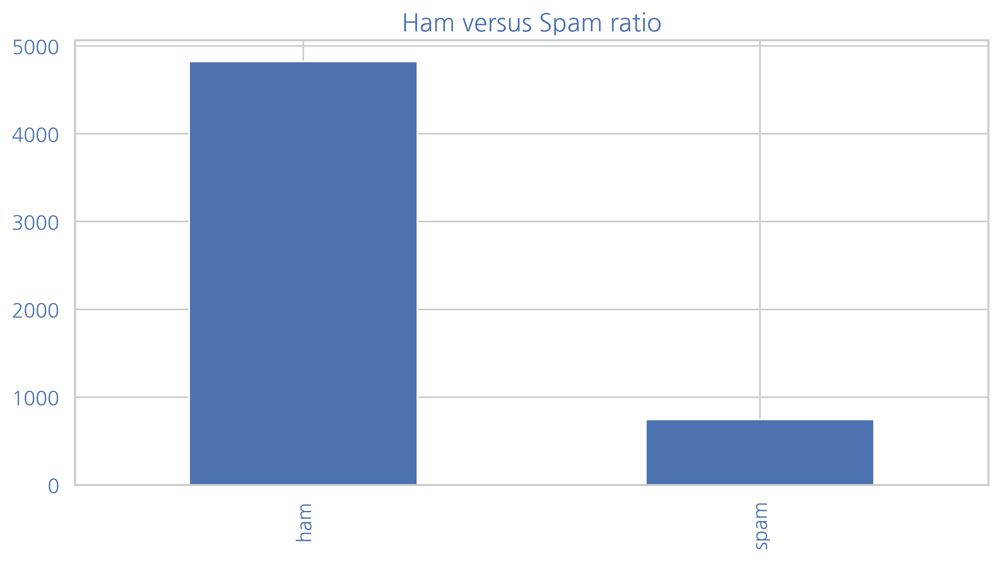

In [8]:
# 타겟의 비율 확인해보기
plt.figure(figsize=(10, 5))
df['target'].value_counts().plot(kind='bar')
plt.title('Ham versus Spam ratio')
plt.show()

In [9]:
df.groupby('target').count().style.background_gradient(cmap='Blues')

,text
target,
ham,4825
spam,747


In [10]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X.text)

rare = []
for k, v in tokenizer.word_counts.items():
    if int(v) == 1:
        rare.append(k)
print('rare words : {}'.format(rare[:5]))
print('rare counts : {}'.format(len(rare)))

rare words : ['jurong', 'amore', 'chgs', 'aids', 'patent']
rare counts : 4511


In [13]:
# 빈도 1짜리 단어를 제외하고 분석
tokenizer = Tokenizer(num_words=len(tokenizer.word_index) - len(rare) + 1)
tokenizer.fit_on_texts(X.text) 
seq = tokenizer.texts_to_sequences(X.text)

# 10번째 시퀀스 확인
np.asarray(seq[1]).reshape(1, -1)

array([[  46,  336, 1495,  470,    6, 1929]])

In [14]:
# 단어장 확인

sent = [None] * 6
for k, v in tokenizer.word_index.items():
    if v == 46:
        sent[0] = k
    if v == 336:
        sent[1] = k
    if v == 1495:
        sent[2] = k
    if v == 470:
        sent[3] = k
    if v == 6:
        sent[4] = k
    if v == 1929:
        sent[5] = k
print(sent) # 빈도 1단어가 삭제됐기 때문에 조금 부자연 스러울 수 있음

['ok', 'lar', 'joking', 'wif', 'u', 'oni']


In [15]:
# 스팸메일 등장빈도 top5
# 스팸메일과 햄메일 사이에 단어 등장 패턴이 달라야 분류가 가능
X_spam = df[df['target'] == 'spam']['text']
tk = Tokenizer()
tk.fit_on_texts(X_spam)
sequences = tk.texts_to_sequences(X_spam)
rank5 = sorted(tk.word_counts.items(), key=lambda item: item[1], reverse=True)[:5]

print('스팸메일 어휘 등장 빈도 Top 5')
for i, (w, f) in enumerate(rank5):
    print('{}위 : '.format(i+1) + w, f)

스팸메일 어휘 등장 빈도 Top 5
1위 : to 688
2위 : a 377
3위 : call 355
4위 : you 290
5위 : your 264


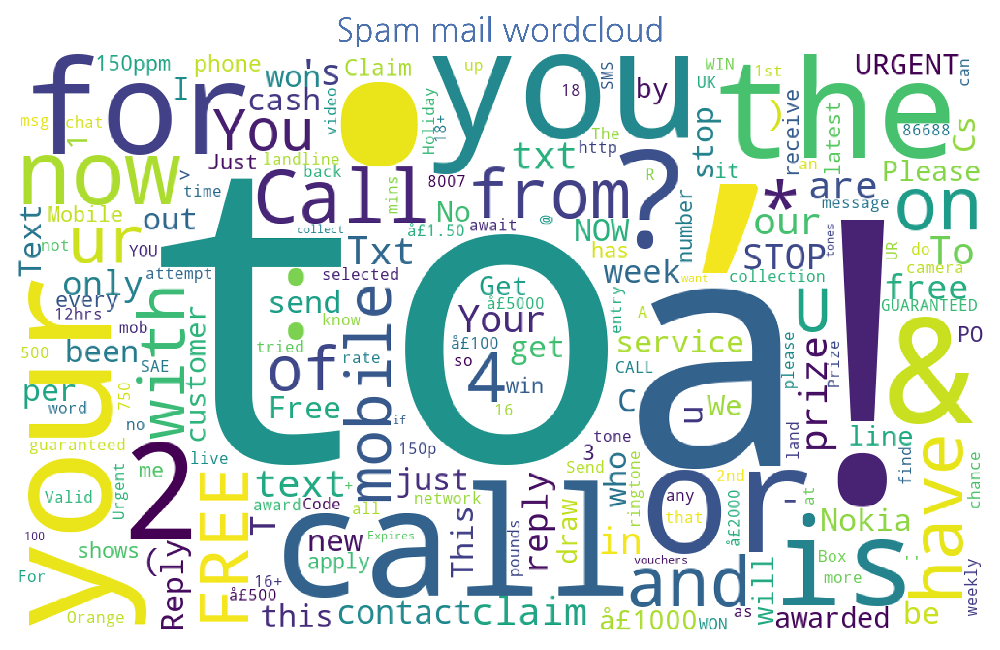

In [27]:
from nltk import Text
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud

text = Text(word_tokenize(' '.join(df[df['target'] == 'spam']['text'].values)))
fd = text.vocab()

wc = WordCloud(width=1000, height=600, background_color="white", random_state=0)
plt.imshow(wc.generate_from_frequencies(fd))
plt.title('Spam mail wordcloud')
plt.axis("off")
plt.show()

In [16]:
# 햄메일 등장빈도 top 5
X_ham = df[df['target'] == 'ham']['text']
tk2 = Tokenizer()
tk2.fit_on_texts(X_ham)
sequences = tk2.texts_to_sequences(X_ham)
rank5 = sorted(tk2.word_counts.items(), key=lambda item: item[1], reverse=True)[:5]

print('햄메일 어휘 등장 빈도 Top 5')
for i, (w, f) in enumerate(rank5):
    print('{}위 : '.format(i+1) + w, f)

햄메일 어휘 등장 빈도 Top 5
1위 : i 2301
2위 : you 1860
3위 : to 1554
4위 : the 1122
5위 : a 1056


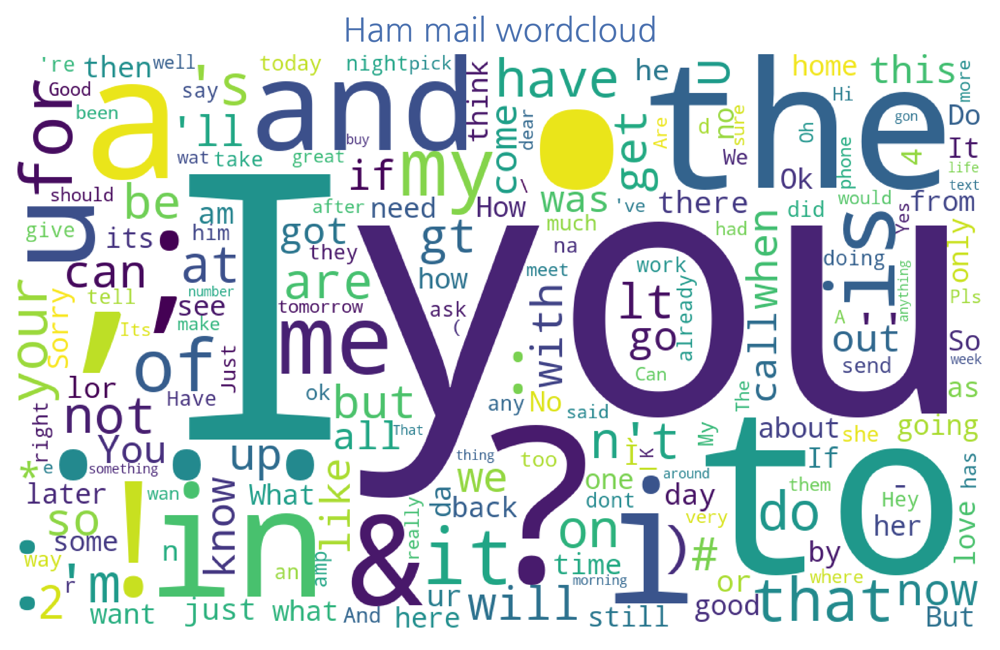

In [28]:
text = Text(word_tokenize(' '.join(df[df['target'] == 'ham']['text'].values)))
fd = text.vocab()

wc = WordCloud(width=1000, height=600, background_color="white", random_state=0)
plt.imshow(wc.generate_from_frequencies(fd))
plt.title('Ham mail wordcloud')
plt.axis("off")
plt.show()

최대 단어 수 :  183
평균 단어 수 :  14.985283560660445
----------------------------------------------------------------------------------------------------


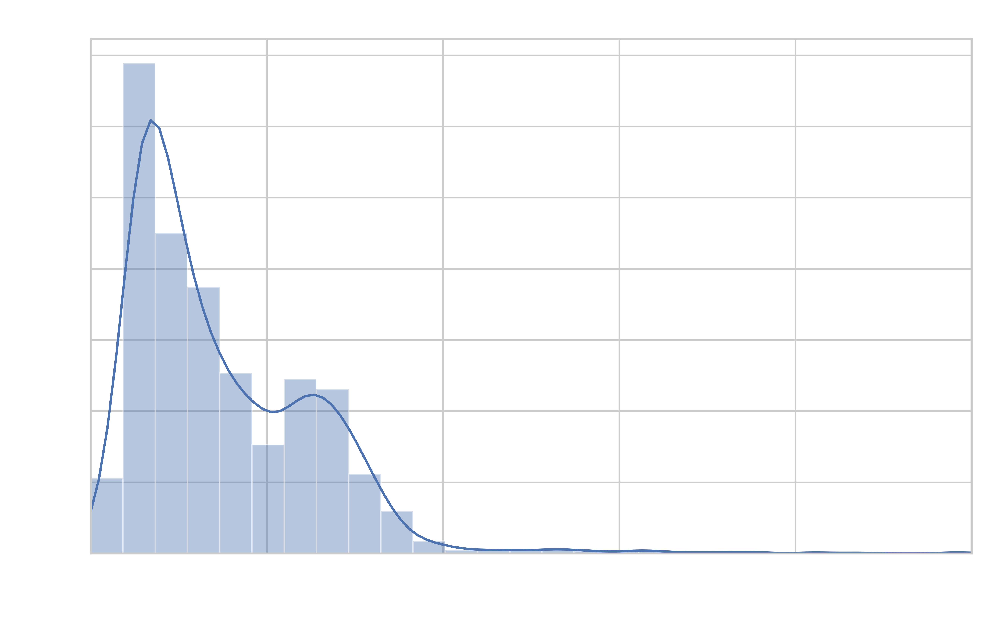

In [193]:
mail_length = [len(x) for x in seq]

print('최대 단어 수 : ', np.max(mail_length))
print('평균 단어 수 : ', np.mean(mail_length))
print('-' * 100)

plt.figure(figsize=(10, 6))
sns.distplot(mail_length, bins=50)
plt.title('메일 당 단어 수 분포')
plt.xlim(0, 100)
plt.xlabel('단어 수')
plt.show()

In [196]:
X = pad_sequences(seq, maxlen=40)
y = y.target.factorize()[0]

### RNN을 활용한 스팸메일 분류

In [197]:
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.25, random_state=0)

In [202]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Embedding(len(tokenizer.word_index) + 1, 64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid'),
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_12 (Embedding)     (None, None, 64)          570944    
_________________________________________________________________
bidirectional_6 (Bidirection (None, 64)                24832     
_________________________________________________________________
dense_20 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 33        
Total params: 597,889
Trainable params: 597,889
Non-trainable params: 0
_________________________________________________________________


In [203]:
EPOCHS = 10
BATCH_SIZE = 64

history = model.fit(train_X, train_y, 
                    validation_data=(test_X, test_y),
                    epochs=EPOCHS, 
                    batch_size=BATCH_SIZE,
                    verbose=2)

Epoch 1/10
66/66 - 5s - loss: 0.3465 - accuracy: 0.8878 - val_loss: 0.1310 - val_accuracy: 0.9634
Epoch 2/10
66/66 - 2s - loss: 0.0566 - accuracy: 0.9866 - val_loss: 0.0487 - val_accuracy: 0.9842
Epoch 3/10
66/66 - 2s - loss: 0.0228 - accuracy: 0.9931 - val_loss: 0.0358 - val_accuracy: 0.9907
Epoch 4/10
66/66 - 2s - loss: 0.0097 - accuracy: 0.9976 - val_loss: 0.0427 - val_accuracy: 0.9878
Epoch 5/10
66/66 - 2s - loss: 0.0050 - accuracy: 0.9993 - val_loss: 0.0391 - val_accuracy: 0.9899
Epoch 6/10
66/66 - 3s - loss: 0.0029 - accuracy: 0.9993 - val_loss: 0.0477 - val_accuracy: 0.9885
Epoch 7/10
66/66 - 2s - loss: 0.0014 - accuracy: 0.9998 - val_loss: 0.0410 - val_accuracy: 0.9907
Epoch 8/10
66/66 - 2s - loss: 0.0015 - accuracy: 0.9995 - val_loss: 0.0480 - val_accuracy: 0.9907
Epoch 9/10
66/66 - 2s - loss: 8.5820e-04 - accuracy: 0.9998 - val_loss: 0.0480 - val_accuracy: 0.9899
Epoch 10/10
66/66 - 2s - loss: 6.8903e-04 - accuracy: 0.9998 - val_loss: 0.0483 - val_accuracy: 0.9907


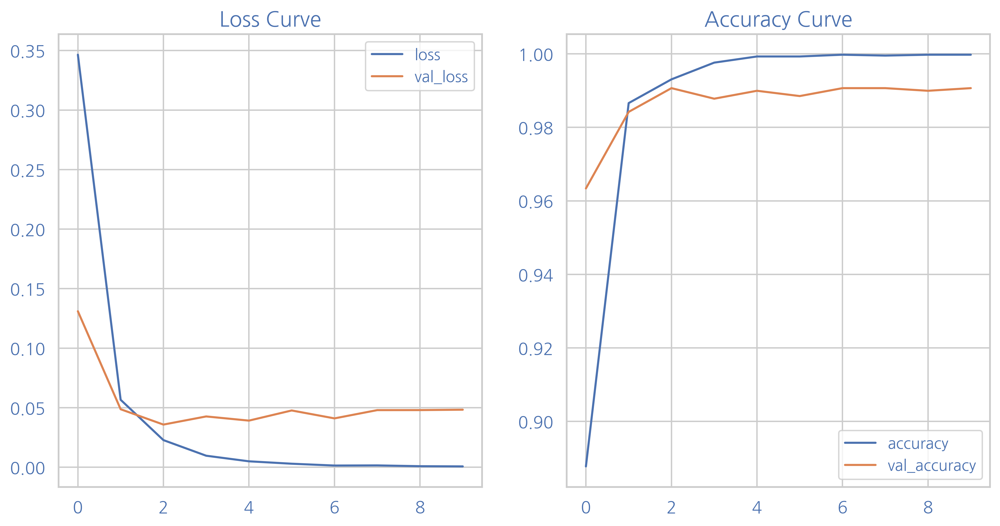

In [223]:
def plot_curve():
    f, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].plot(history.history['loss'], label='loss')
    axs[0].plot(history.history['val_loss'], label='val_loss')
    axs[0].legend()
    axs[0].set_title('Loss Curve')
    axs[1].plot(history.history['accuracy'], label='accuracy')
    axs[1].plot(history.history['val_accuracy'], label='val_accuracy')
    axs[1].legend()
    axs[1].set_title('Accuracy Curve')
    plt.show()

plot_curve()

In [228]:
mus = model.predict(test_X)
y_pred = [np.where(mu >= 0.5, 1, 0) for mu in mus]

print(classification_report(test_y, y_pred))
print('-' * 100, '\n')
print('정확도 : ', accuracy_score(test_y, y_pred))
print('정밀도 : ', recall_score(test_y, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1196
           1       0.98      0.95      0.97       197

    accuracy                           0.99      1393
   macro avg       0.99      0.97      0.98      1393
weighted avg       0.99      0.99      0.99      1393

---------------------------------------------------------------------------------------------------- 

정확도 :  0.990667623833453
정밀도 :  0.949238578680203


### 비대칭 데이터

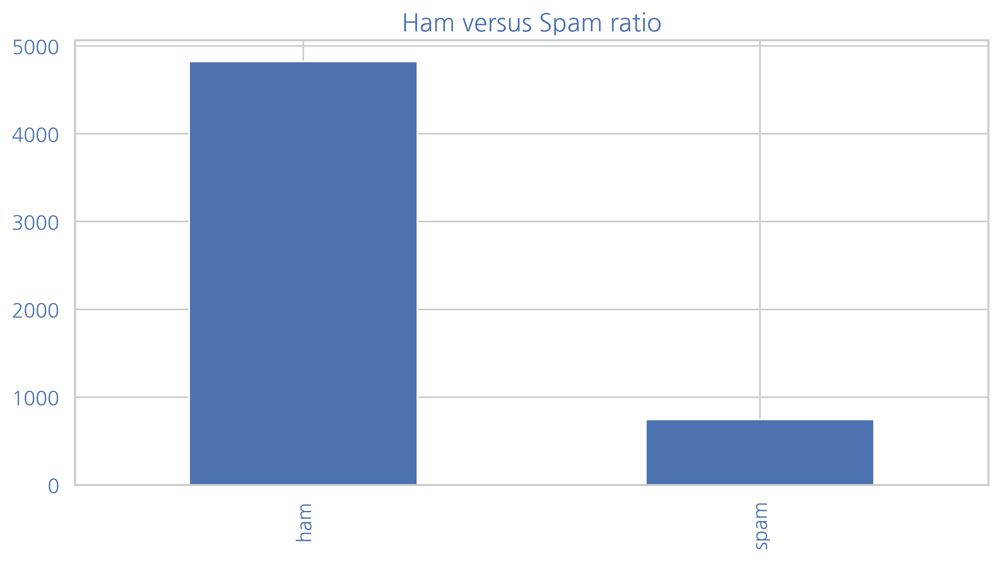

In [230]:
plt.figure(figsize=(10, 5))
df['target'].value_counts().plot(kind='bar')
plt.title('Ham versus Spam ratio')
plt.show()

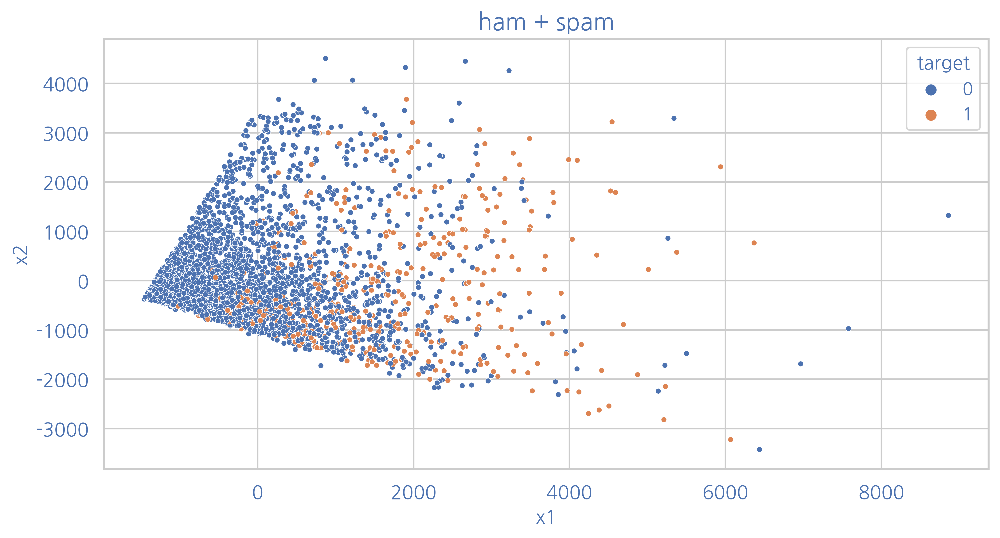

In [237]:
pca = PCA(n_components=2)
X_2d = pca.fit_transform(train_X)
X_2d = pd.DataFrame(X_2d, columns=['x1', 'x2'])


df_2d = pd.concat([X_2d, pd.Series(train_y, name='target')], axis=1)

mask0 = df_2d['target'] == 0
mask0 = df_2d['target'] == 1

plt.figure(figsize=(10, 5))
sns.scatterplot(x='x1', y='x2', data=df_2d, hue='target', s=12)
plt.title('ham + spam')
plt.show()

In [275]:
# 오버샘플링 기법을 이용
blcd_X, blcd_y = SMOTE(random_state=0).fit_resample(train_X, train_y)

model = tf.keras.models.Sequential([
    tf.keras.layers.Embedding(len(tokenizer.word_index) + 1, 64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid'),
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', Recall()])

EPOCHS = 10
BATCH_SIZE = 256

history = model.fit(blcd_X, blcd_y, 
                    validation_data=(test_X, test_y), 
                    epochs=EPOCHS, 
                    batch_size=BATCH_SIZE)

Epoch 1/10
29/29 [==============================] - 8s 165ms/step - loss: 0.6587 - accuracy: 0.6594 - recall_9: 0.3822 - val_loss: 0.3579 - val_accuracy: 0.8169 - val_recall_9: 0.8376
Epoch 2/10
29/29 [==============================] - 3s 107ms/step - loss: 0.3316 - accuracy: 0.8733 - recall_9: 0.9100 - val_loss: 0.1774 - val_accuracy: 0.9375 - val_recall_9: 0.9594
Epoch 3/10
29/29 [==============================] - 3s 110ms/step - loss: 0.1433 - accuracy: 0.9501 - recall_9: 0.9345 - val_loss: 0.1573 - val_accuracy: 0.9476 - val_recall_9: 0.9239
Epoch 4/10
29/29 [==============================] - 4s 150ms/step - loss: 0.1009 - accuracy: 0.9703 - recall_9: 0.9527 - val_loss: 0.1643 - val_accuracy: 0.9454 - val_recall_9: 0.9492
Epoch 5/10
29/29 [==============================] - 4s 145ms/step - loss: 0.0679 - accuracy: 0.9816 - recall_9: 0.9738 - val_loss: 0.2230 - val_accuracy: 0.9347 - val_recall_9: 0.9797
Epoch 6/10
29/29 [==============================] - 4s 141ms/step - loss: 0.0573

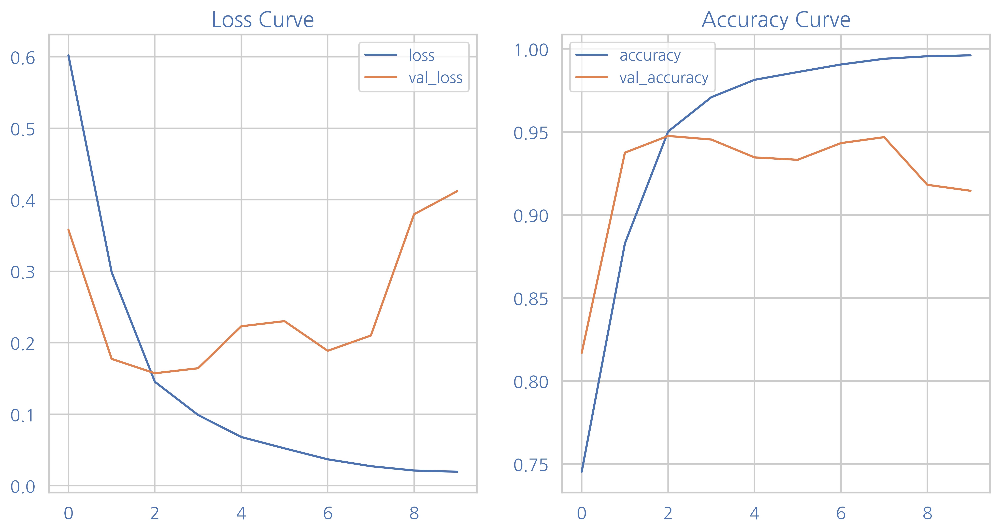

In [276]:
plot_curve()

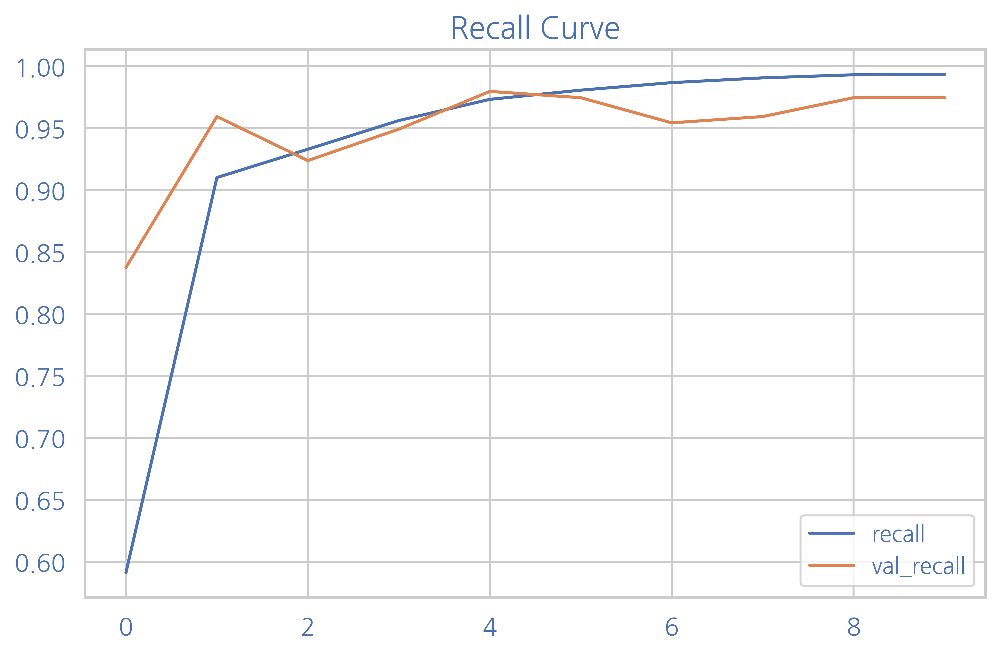

In [278]:
plt.plot(history.history['recall_9'], label='recall')
plt.plot(history.history['val_recall_9'], label='val_recall')
plt.legend()
plt.title('Recall Curve')
plt.show()

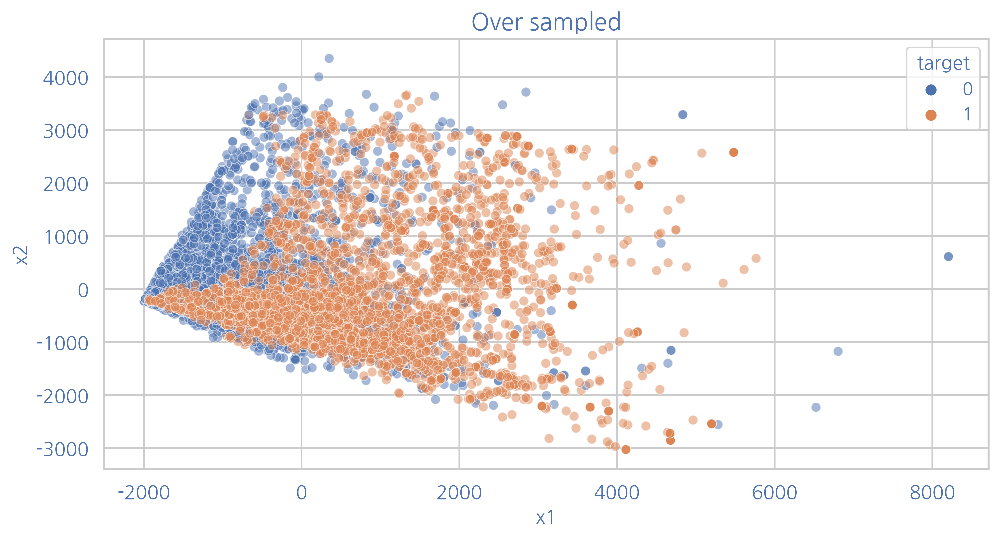

In [282]:
pca = PCA(n_components=2)
X_2d = pca.fit_transform(blcd_X)
X_2d = pd.DataFrame(X_2d, columns=['x1', 'x2'])

df_2d = pd.concat([X_2d, pd.Series(blcd_y, name='target')], axis=1)

plt.figure(figsize=(10, 5))
sns.scatterplot(x='x1', y='x2', data=df_2d, hue='target', alpha=0.5)
plt.title('Over sampled')
plt.show()

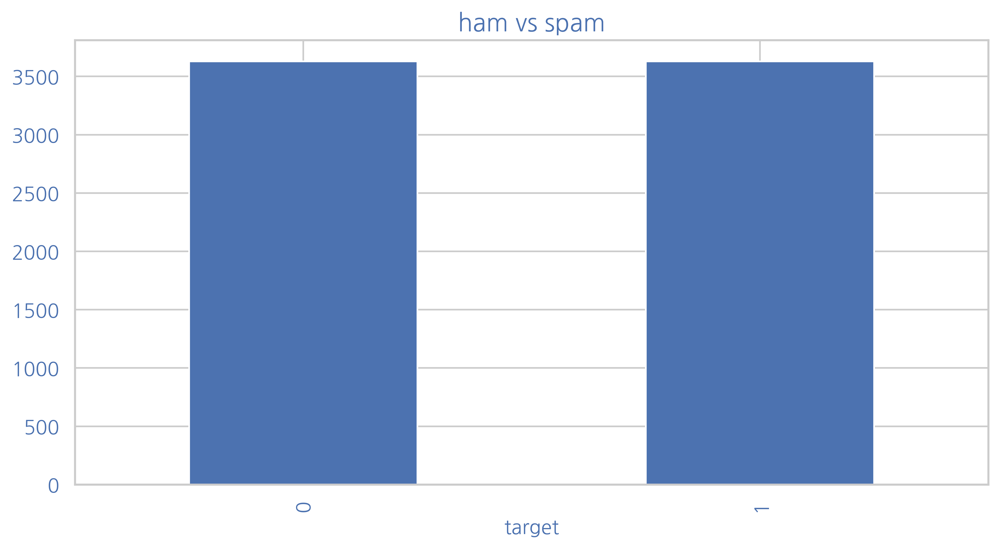

In [283]:
plt.figure(figsize=(10, 5))
df_2d.groupby('target').size().plot(kind='bar')
plt.title('ham vs spam')
plt.show()

In [285]:
mus = model.predict(test_X)
y_pred = [np.where(mu >= 0.5, 1, 0) for mu in mus]
print(classification_report(test_y, y_pred))
# 재현율: 0.94 -> 0.97
print('정확도 : ', accuracy_score(test_y, y_pred))
print('정밀도 : ', recall_score(test_y, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.90      0.95      1196
           1       0.63      0.97      0.76       197

    accuracy                           0.91      1393
   macro avg       0.81      0.94      0.86      1393
weighted avg       0.94      0.91      0.92      1393

정확도 :  0.914572864321608
정밀도 :  0.9746192893401016


### 결과 확인

In [286]:
def predict_spam(text):
    seq = pad_sequences(tokenizer.texts_to_sequences(text), maxlen=20)
    prob = model.predict(seq)
    (result, belief) = ('스팸', prob) if prob >= 0.5 else ('햄', 1-prob)
    
    print('{}%의 신뢰도로 {}입니다.'.format(round(float(belief), 2), result))

In [287]:
text = ['''
How are you doing today? I am Mr. Fong pau teck a staff of a reputable financial institution here in Malaysia.
An investment was placed under my management. I need your assistance in investing the fund in your country into a good business.
If you are interested reply back, so I can forward you with more details.
''']

predict_spam(text)

0.97%의 신뢰도로 햄입니다.


In [288]:
text = ['''
Your business should be accepting Credit Cards from your customers!
Increase your sales by 30, 40 even 50 percent by accepting Credit Cards
''']

predict_spam(text)

0.96%의 신뢰도로 스팸입니다.


In [291]:
test = ['''
Hi, How are you! 
Tell you a good news Louis Vuitton site Up to 50% Off New arrivals.SHOP NOW! Don't miss it!
''']

predict_spam(text)

0.96%의 신뢰도로 스팸입니다.


In [422]:
from copy import deepcopy
from math import ceil

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from imblearn.over_sampling import SMOTE

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


class BinaryTextClassifier:
    def __init__(self, texts, labels, vocab_size, maxlen, over_sampling=False, test_size=0.25):
        self.texts = texts
        self.labels = labels
        self.vocab_size = vocab_size
        self.maxlen = maxlen
        self.test_size = test_size
        self.over_sampling = over_sampling
        self.tokenizer = {}
        self.model = tf.keras.models.Sequential([
                        tf.keras.layers.Embedding(self.vocab_size, 64),
                        tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
                        tf.keras.layers.Dense(32, activation='relu'),
                        tf.keras.layers.Dense(1, activation='sigmoid'),
                    ])

    
    def train(self, epochs=5, batch_size=64):
        tokenizer = Tokenizer(num_words=self.vocab_size)
        tokenizer.fit_on_texts(self.texts) 
        
        self.tokenizer = tokenizer
        
        seq = tokenizer.texts_to_sequences(self.texts)
        padded = pad_sequences(seq, maxlen=self.maxlen)

        y = LabelEncoder().fit_transform(self.labels)
        
        train_X, test_X, train_y, test_y = train_test_split(padded, y, test_size=self.test_size)
        
        if self.over_sampling:
            train_X, train_y = SMOTE(random_state=0).fit_resample(train_X, train_y)
        
        self.model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        history = self.model.fit(train_X, train_y, 
                    validation_data=(test_X, test_y),
                    epochs=epochs, 
                    batch_size=batch_size,
                    verbose=2)
        
        return history
        
        
    def predict(self, text):
        seq = pad_sequences(self.tokenizer.texts_to_sequences([text]), maxlen=self.maxlen)
        prob = self.model.predict(seq)
        (result, belief) = ('positive class', prob) if prob >= 0.5 else ('negative class', 1-prob)

        print('{}%의 신뢰도로 {}입니다.'.format(round(float(belief), 2), result))

In [423]:
texts = df['text'].values
labels = df['target'].values
vocab_size = 4000
maxlen = 40

btc = BinaryTextClassifier(texts, labels, vocab_size, maxlen, over_sampling=False, test_size=0.25)

In [425]:
btc.train(epochs=5, batch_size=64)

Epoch 1/5
66/66 - 7s - loss: 0.0610 - accuracy: 0.9830 - val_loss: 0.0341 - val_accuracy: 0.9878
Epoch 2/5
66/66 - 1s - loss: 0.0269 - accuracy: 0.9921 - val_loss: 0.0375 - val_accuracy: 0.9871
Epoch 3/5
66/66 - 1s - loss: 0.0137 - accuracy: 0.9957 - val_loss: 0.0327 - val_accuracy: 0.9928
Epoch 4/5
66/66 - 1s - loss: 0.0060 - accuracy: 0.9983 - val_loss: 0.0416 - val_accuracy: 0.9892
Epoch 5/5
66/66 - 2s - loss: 0.0033 - accuracy: 0.9993 - val_loss: 0.0407 - val_accuracy: 0.9885


In [429]:
btc.predict('Buy our new product! 50% discount')

0.95%의 신뢰도로 positive class입니다.


In [430]:
btc.predict('Hey, john. Long time no see.')

1.0%의 신뢰도로 negative class입니다.
